In [3]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os

In [10]:
from newsapi import NewsApiClient

# Init
newsapi = NewsApiClient(api_key='0fcff029a90d4810a31082fb2552bc24')

#extra keys d39c4bc2a2074e95a93c399f8b27d902, 0fcff029a90d4810a31082fb2552bc24, 73811b6e49ff4d5b990cf12fdda52596

In [11]:
# /v2/top-headlines/sources
sources = newsapi.get_sources()
type(sources)

dict

In [12]:
sources_1 = pd.DataFrame.from_dict(sources['sources'])
sources_1[sources_1['country']=='us']
sources_1['category'].value_counts()

category
general          75
technology       14
business         13
sports           13
entertainment     8
science           3
health            1
Name: count, dtype: int64

In [13]:
EM_countries = ["abu dhabi", "angola", "argentina", "azerbaijan", "bahrain", "bolivia", "brazil", "bulgaria", 
 "chile", "china", "colombia", "costa rica", "dominican republic", "dubai", "ecuador", "egypt", 
 "el salvador", "ghana", "guatemala", "hungary", "indonesia", "iraq", "ivory coast", "jamaica", 
 "jordan", "kazakhstan", "kenya", "kuwait", "latvia", "lebanon", "malaysia", "mexico", "morocco", 
 "nigeria", "oman", "pakistan", "panama", "paraguay", "peru", "philippines", "poland", "qatar", 
 "romania", "saudi arabia", "senegal", "serbia", "south africa", "sri lanka", "trinidad and tobago", 
 "turkey", "ukraine", "united arab emirates", "uruguay", "zambia"]

In [14]:
all_df = pd.DataFrame({
    'source':[], 'author': [],'title':[], 'description':[], 'url':[], 'urlToImage':[],
       'publishedAt':[], 'content':[]
})

for country in EM_countries:
    print(country)
    all_articles = newsapi.get_everything(q=country,
                                      from_param='2025-02-08',
                                      to='2025-03-07',
                                      language='en'
                                     )
    more =all_articles['articles']
    my_df =pd.DataFrame(more)
    my_df['country']=country
    dfs= [all_df,my_df]
    all_df = pd.concat(dfs)
    


abu dhabi
angola
argentina
azerbaijan
bahrain
bolivia
brazil
bulgaria
chile
china
colombia
costa rica
dominican republic
dubai
ecuador
egypt
el salvador
ghana
guatemala
hungary
indonesia
iraq
ivory coast
jamaica
jordan
kazakhstan
kenya
kuwait
latvia
lebanon
malaysia
mexico
morocco
nigeria
oman
pakistan
panama
paraguay
peru
philippines
poland
qatar
romania
saudi arabia
senegal
serbia
south africa
sri lanka
trinidad and tobago
turkey
ukraine
united arab emirates
uruguay
zambia


In [15]:
all_df.drop(['author','url','urlToImage'], axis=1, inplace=True)

import pandas as pd

In [16]:
all_df.to_csv(r"all_df.csv")

In [1]:
#pulling data in and out of CSV

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os

all_df=pd.read_csv(r"all_df.csv")

In [2]:
all_df.drop(columns='Unnamed: 0', axis=1,inplace=True)

In [3]:
import ast

# Ensure that 'null' is replaced with Python's `None` if it's a string
all_df['source'] = all_df['source'].apply(lambda x: x.replace("null", "None") if isinstance(x, str) else x)

# Apply ast.literal_eval() to each entry
all_df['source'] = all_df['source'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# Now extract the 'name' from the dictionary
all_df['source'] = all_df['source'].apply(lambda x: x['name'] if isinstance(x, dict) else x)



In [4]:
from datetime import datetime

all_df['publishedAt']=all_df['publishedAt'].apply(lambda x: datetime.strptime(x,"%Y-%m-%dT%H:%M:%SZ").date())


## Visual of which countries get mentions ##

In [5]:
#pip install folium

In [6]:
article_count= all_df.groupby(['country']).count()
article_count.columns

Index(['source', 'title', 'description', 'publishedAt', 'content'], dtype='object')

In [7]:
article_count.drop(columns= ['title', 'description', 'publishedAt', 'content'], axis=1, inplace=True)



In [8]:
article_count['country']=article_count.index.str.capitalize()


In [9]:
import folium


In [10]:


m = folium.Map(location=(30, 10), zoom_start=2, tiles="cartodb positron")

political_countries_url = (
    "https://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson")

folium.GeoJson(political_countries_url).add_to(m)
folium.TileLayer('CartoDB positron', opacity=0.2).add_to(m)

folium.Choropleth(
    geo_data=political_countries_url,
    name="choropleth",
    data=article_count,
    columns=["country", "source"],
    key_on="feature.properties.name",
    fill_color="RdYlGn_r",
    fill_opacity=0.7,
    line_opacity=0.1,
    nan_fill_color="white",
    legend_name="Number of Articles",
).add_to(m)

folium.LayerControl().add_to(m)

m

## Make graph of mentions over time

In [11]:
all_df=all_df.rename(columns={'publishedAt':'Date'})
all_df[all_df['title'].str.contains('TF Kaan', case=False, na=False)]

,source,title,description,Date,content,country
21,Forbes,TF Kaan: Why UAE Might Be Interested In Turkey...,The UAE could well seek a role in manufacturin...,2025-02-25,"TF Kaan, national combat aircraft, arrives to ...",abu dhabi


In [12]:
daily_mentions= all_df.groupby(['Date','country']).count()
daily_mentions

source  title  description  content
Date       country                                                  
2025-02-08 abu dhabi                  9      9            9        9
           angola                     4      4            4        4
           argentina                  2      2            2        2
           azerbaijan                 3      3            3        3
           bahrain                    1      1            1        1
...                                 ...    ...          ...      ...
2025-03-07 trinidad and tobago        2      2            2        2
           ukraine                    4      4            4        4
           united arab emirates       2      2            2        2
           uruguay                    6      6            6        6
           zambia                     4      4            4        4

[1381 rows x 4 columns]

In [13]:
daily_mentions.reset_index().head()

,Date,country,source,title,description,content
0,2025-02-08,abu dhabi,9,9,9,9
1,2025-02-08,angola,4,4,4,4
2,2025-02-08,argentina,2,2,2,2
3,2025-02-08,azerbaijan,3,3,3,3
4,2025-02-08,bahrain,1,1,1,1


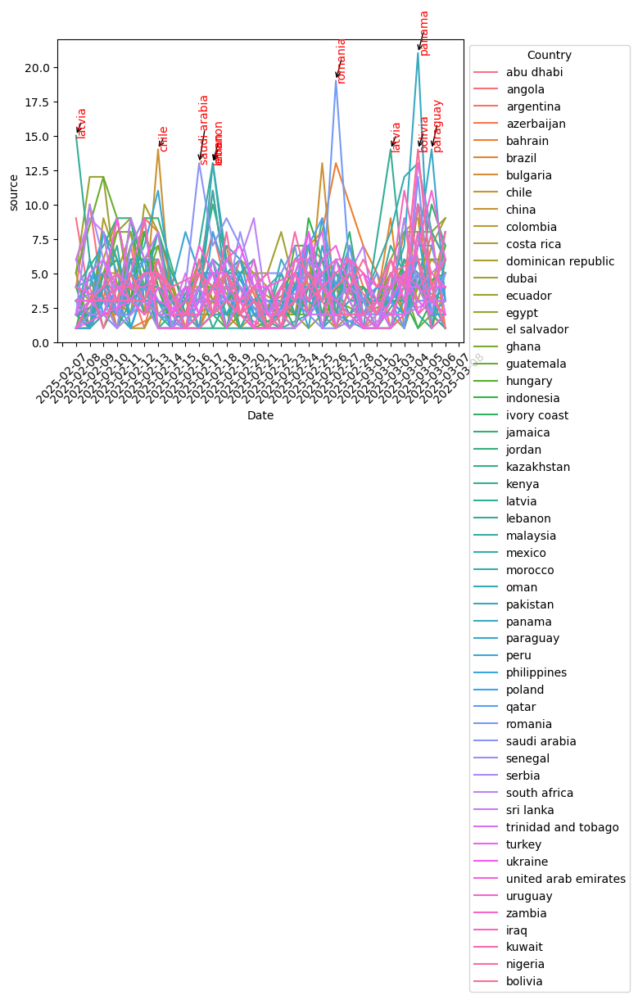

In [14]:
sns.lineplot(data=daily_mentions, x='Date', y='source', hue='country')
# Format the x-axis to show one tick per date
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Set date format on x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Set the locator to get one tick per day
plt.gca().xaxis.set_major_locator(mdates.DayLocator())

# Sort the data to get the top 10 maximum values
top_10_max_points = daily_mentions.nlargest(10, 'source')

# Annotate the top 10 max points with vertical country labels
for idx, row in top_10_max_points.iterrows():
    max_date = row.name[0]  # Access the 'Date' from the MultiIndex
    max_country = row.name[1]  # Access the 'Country' from the MultiIndex
    max_value = row['source']
    
    # Annotate the point with the country name vertically
    plt.annotate(f'{max_country}', 
                 xy=(max_date, max_value), 
                 xytext=(max_date, max_value + 0.1),  # Offset the text to avoid overlap
                 arrowprops=dict(facecolor='black', arrowstyle='->'),
                 fontsize=10, color='red', rotation=90)  # Vertical label with 90 degrees rotation
    
# Move the legend to the side of the plot (e.g., to the right)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Country")


# Show the plot
plt.show()

## Let's Make Bag of Words in Prep for more analysis

In [15]:
import pandas as pd
import re


from io import StringIO
import matplotlib.pyplot as plt

from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import RegexpTokenizer

from sklearn import svm
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

In [16]:
all_df['same']= all_df['description'] == all_df['content']

In [17]:
#As there is repetition between content and description, we will use only Title and Content
all_df.same.value_counts()

same
False    5107
True        8
Name: count, dtype: int64

In [18]:
all_df.head(5)

,source,title,description,Date,content,country,same
0,Yahoo Entertainment,Archer Aviation stock takes off on new Abu Dha...,NaN,2025-02-28,"If you click 'Accept all', we and our partners...",abu dhabi,False
1,Yanko Design,Abu Dhabi’s Upcoming Art Space Allows You To I...,Abu Dhabi’s Upcoming Art Space Allows You To I...,2025-03-02,In a landmark moment for Abu Dhabis cultural l...,abu dhabi,False
2,HYPEBEAST,Step Into teamLab Phenomena in Abu Dhabi,teamLab Phenomena Abu Dhabi is set to open its...,2025-02-26,teamLab Phenomena Abu Dhabi is set to open its...,abu dhabi,False
3,The Verge,Self-driving cars: Google and others map the r...,Google and a number of automakers are spearhea...,2025-03-03,Google and a number of automakers are spearhea...,abu dhabi,False
4,BBC News,India v Pakistan: Cricket's ultimate grudge ma...,Sunday’s Champions Trophy clash in Dubai promi...,2025-02-22,Gautam Bhattacharyya\r\nA billboard in Lahore ...,abu dhabi,False


In [19]:
columns= ['title','content']

In [20]:
all_df.reset_index(drop=True, inplace=True)


for index, row in all_df.iterrows():
    words = ''
    for col in columns:
        value = row[col]
    
        # Check if the value is a string
        if isinstance(value, str):
            # If it's a string, split it into words and join them
            words = words + ' '.join(value.split()) + ' '
        elif isinstance(value, list):
            # If it's a list, join the elements with spaces
            words = words + ' '.join(map(str, value)) + ' '
        else:
            # If it's any other type (e.g., number, NaN), convert it to string
            words = words + str(value) + ' '
    
    # Assign the resulting 'words' string to the 'bow' column for the current row
    all_df.at[index, 'bow'] = words

In [21]:
all_df.head(19)

,source,title,description,Date,content,country,same,bow
0,Yahoo Entertainment,Archer Aviation stock takes off on new Abu Dha...,NaN,2025-02-28,"If you click 'Accept all', we and our partners...",abu dhabi,False,Archer Aviation stock takes off on new Abu Dha...
1,Yanko Design,Abu Dhabi’s Upcoming Art Space Allows You To I...,Abu Dhabi’s Upcoming Art Space Allows You To I...,2025-03-02,In a landmark moment for Abu Dhabis cultural l...,abu dhabi,False,Abu Dhabi’s Upcoming Art Space Allows You To I...
2,HYPEBEAST,Step Into teamLab Phenomena in Abu Dhabi,teamLab Phenomena Abu Dhabi is set to open its...,2025-02-26,teamLab Phenomena Abu Dhabi is set to open its...,abu dhabi,False,Step Into teamLab Phenomena in Abu Dhabi teamL...
3,The Verge,Self-driving cars: Google and others map the r...,Google and a number of automakers are spearhea...,2025-03-03,Google and a number of automakers are spearhea...,abu dhabi,False,Self-driving cars: Google and others map the r...
4,BBC News,India v Pakistan: Cricket's ultimate grudge ma...,Sunday’s Champions Trophy clash in Dubai promi...,2025-02-22,Gautam Bhattacharyya\r\nA billboard in Lahore ...,abu dhabi,False,India v Pakistan: Cricket's ultimate grudge ma...
5,HYPEBEAST,"BRED Abu Dhabi Announces PARTYNEXTDOOR, Nas an...","BRED Abu Dhabi, presented by Hypebeast is retu...",2025-02-24,"BRED Abu Dhabi, presented by Hypebeast is retu...",abu dhabi,False,"BRED Abu Dhabi Announces PARTYNEXTDOOR, Nas an..."
6,BBC News,Bowler Wong in England pathway training camp s...,Issy Wong is included in an England pathway sq...,2025-02-27,Issy Wong has been included in an England path...,abu dhabi,False,Bowler Wong in England pathway training camp s...
7,BBC News,Wright to compete in Abu Dhabi after safety as...,Top-ranked surfer Tyler Wright will compete in...,2025-02-14,Two-time world surfing champion Tyler Wright w...,abu dhabi,False,Wright to compete in Abu Dhabi after safety as...
8,Yahoo Entertainment,Abu Dhabi’s First IPO of the Year Rides AI Boo...,(Bloomberg) -- Alpha Data is likely to price i...,2025-02-24,(Bloomberg) -- Alpha Data is likely to price i...,abu dhabi,False,Abu Dhabi’s First IPO of the Year Rides AI Boo...
9,PetaPixel,Surfer Smashes Into Photographer During Compet...,A world champion surfer accidentally collided ...,2025-02-18,Filipe Toledo collided with an official water ...,abu dhabi,False,Surfer Smashes Into Photographer During Compet...


## Trying to use Spacy to find NER (seems to be able to find double words and without using POS)

In [22]:
#pip install spacy

In [23]:
!python -m spacy download en_core_web_sm

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ------- -------------------------------- 2.4/12.8 MB 14.9 MB/s eta 0:00:01
     -------------- ------------------------- 4.7/12.8 MB 14.2 MB/s eta 0:00:01
     ------------------------ --------------- 7.9/12.8 MB 12.8 MB/s eta 0:00:01
     ------------------------------- ------- 10.5/12.8 MB 12.8 MB/s eta 0:00:01
     --------------------------------------  12.6/12.8 MB 12.9 MB/s eta 0:00:01
     --------------------------------------- 12.8/12.8 MB 11.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [24]:
import spacy 
import requests 
from bs4 import BeautifulSoup
nlp = spacy.load("en_core_web_sm")
pd.set_option("display.max_rows", 200)

In [25]:
all_df['doc'] = all_df['bow'].apply(lambda x: nlp(x))

In [26]:
all_df

,source,title,description,Date,content,country,same,bow,doc
0,Yahoo Entertainment,Archer Aviation stock takes off on new Abu Dha...,NaN,2025-02-28,"If you click 'Accept all', we and our partners...",abu dhabi,False,Archer Aviation stock takes off on new Abu Dha...,"(Archer, Aviation, stock, takes, off, on, new,..."
1,Yanko Design,Abu Dhabi’s Upcoming Art Space Allows You To I...,Abu Dhabi’s Upcoming Art Space Allows You To I...,2025-03-02,In a landmark moment for Abu Dhabis cultural l...,abu dhabi,False,Abu Dhabi’s Upcoming Art Space Allows You To I...,"(Abu, Dhabi, ’s, Upcoming, Art, Space, Allows,..."
2,HYPEBEAST,Step Into teamLab Phenomena in Abu Dhabi,teamLab Phenomena Abu Dhabi is set to open its...,2025-02-26,teamLab Phenomena Abu Dhabi is set to open its...,abu dhabi,False,Step Into teamLab Phenomena in Abu Dhabi teamL...,"(Step, Into, teamLab, Phenomena, in, Abu, Dhab..."
3,The Verge,Self-driving cars: Google and others map the r...,Google and a number of automakers are spearhea...,2025-03-03,Google and a number of automakers are spearhea...,abu dhabi,False,Self-driving cars: Google and others map the r...,"(Self, -, driving, cars, :, Google, and, other..."
4,BBC News,India v Pakistan: Cricket's ultimate grudge ma...,Sunday’s Champions Trophy clash in Dubai promi...,2025-02-22,Gautam Bhattacharyya\r\nA billboard in Lahore ...,abu dhabi,False,India v Pakistan: Cricket's ultimate grudge ma...,"(India, v, Pakistan, :, Cricket, 's, ultimate,..."
...,...,...,...,...,...,...,...,...,...
5110,Globalsecurity.org,UN releases US$110 million to shore up life-sa...,With global humanitarian funding being scaled ...,2025-03-07,UNOCHA - United Nations Office for the Coordin...,zambia,False,UN releases US$110 million to shore up life-sa...,"(UN, releases, US$, 110, million, to, shore, u..."
5111,DW (English),Zimbabwe battles aid shortages as drought bites,As the effects of a devastating drought take h...,2025-03-05,"Buhera, in Zimbabwe's eastern Manicaland Provi...",zambia,False,Zimbabwe battles aid shortages as drought bite...,"(Zimbabwe, battles, aid, shortages, as, drough..."
5112,The Week Magazine,PEPFAR's uncertain future,The U.S.-funded effort against AIDS has saved ...,2025-02-25,What is PEPFAR? \r\nThe President's Emergency ...,zambia,False,PEPFAR's uncertain future What is PEPFAR? The ...,"(PEPFAR, 's, uncertain, future, What, is, PEPF..."
5113,ETF Daily News,First Quantum Minerals (FQVLF) Projected to Po...,First Quantum Minerals (OTCMKTS:FQVLF – Get Fr...,2025-02-10,First Quantum Minerals (OTCMKTS:FQVLF – Get Fr...,zambia,False,First Quantum Minerals (FQVLF) Projected to Po...,"(First, Quantum, Minerals, (, FQVLF, ), Projec..."


In [56]:
#adding a list made below: 
replace_list = {
    'brazilian': 'brazil',
    'brazils': 'brazil',
    'brits': 'brit',
    'burrows': 'burrow',
    'chinese': 'china',
    'chinas': 'china',
    'defence': 'defense',
    'democrats': 'democrat',
    'european': 'europe',
    'fires': 'fire',
    'french': 'france',
    'german': 'germany',
    'indian': 'india',
    'israelis': 'israel',
    'japanese': 'japan',
    'latin american': 'latin america',
    'mexican': 'mexico',
    'moroccos': 'morocco',
    'north american': 'north america',
    'palestinians': 'palestine',
    'palestinian': 'palestine',
    'republicans': 'republican',
    'russian': 'russia',
    'russias': 'russia',
    'south american': 'south america',
    'teslas': 'tesla',
    'trumps': 'trump',
    'donald trump': 'trump',
    'donald trump’s': 'trump',
    'trump’s': 'trump',
    'uk': 'united kingdom',
    'u.s.': 'united states',
    'usa': 'united states',
    'the united states': 'united states',
    'united states of america': 'united states',
    'america': 'united states',
    'worlds': 'world',
    'iranian': 'iran',
    'ukrainian': 'ukraine',
    'euros': 'euro',
    'us': 'united states',
    'wales': 'wale', 
    'googles': 'google', 
    'safaris': 'safari', 
    'finalists': 'finalist',  
    'marines': 'marine', 
    'earths': 'earth', 
    'nazis': 'nazi',  
    'kingdoms': 'kingdom',
    'bolivias': 'bolivia',
    'elon musk': 'musk',
    'marco rubio':'rubio',
    'un':'united nations',
    'daniel noboa': 'noboa',
    'israeli': 'israel',
    'american': 'united states',
    'america': 'united states',
    'african':'africa',
    'british':'britain',
    'turkish' : 'turkey',
    'canadian':'canada',
    'saudi':'saudi arabia',
    'americans': 'united states',
    'donald trumps': 'trump',  
    'west african' : 'west africa',
    'volodymyr zelensky': 'zelensky',
    'vladimir putin' : 'putin',
     'volodymyr zelenskyy': 'zelensky',
     'nigerian': 'nigeria',
     'venezuelan': 'venezuela',
    'javier milei': 'milei',
    'australian': 'australia',
    'spanish': 'spain',
    'polish':'poland',
     'the united arab emirates':'uae',
     'the european union': 'eu',
    'indonesian': 'indonesia',
     "elon musk's": 'musk',
    'türkiye': 'turkey',
    "zak brown's": 'zak brown',
    'sri lanka:': 'sri lanka',
    'egyptian': 'egypt',
    'colombian': 'colombia',
    'lionel messi':'messi',
    'jd vance':'vance', 
    'valentine’s day': 'valentines',
    'the department of government efficiency':'doge',
    'the middle east':'middle east',
    'south african':'south africa',
    'hungarian': 'hungary',
    'latam': 'latin america',
    "sri lanka's": 'sri lanka',
    'benjamin netanyahu': 'netanyahu',
    'israels': 'israel',
    'lebanese': 'lebanon',
    'the united kingdom':'united kingdom',
    'bulgarian': 'bulgaria',
    'the democratic republic of congo':'drc',
    'kenyan': 'kenya',
    'malaysian': 'malaysia',
    'turkiye': 'turkey', 
    'azerbaijani': 'azerbaijan',
    'dr congo': 'drc',
    'jamaican':'jamaica',
    'great britain':'britain',
    "donald trump's":'trump',
    'emmanuel macron': 'macron', 
    'jordans':'jordan',
    'recep tayyip erdogan': 'ergodan',
     'jose mourinho': 'mourinho', 
    'africas':'africa',
     'pakistani': 'pakistan',
     "el salvador's": 'el salvador',
     'syrian':'syria',
     'united arab':'uae',
     'ukrainians':'ukraine',
    'u.n.':'un',
    'u.k.': 'united kingdom',
    'hassan nasrallah':'nasrallah', 
    'romanian': 'romania', 
    'democratic republic of congo':'drc',
     'canadians':'canada',
     'argentine': 'argentina', 
     'italian': 'italy', 
     'georgian':'georgia',
    'jair bolsonaro': 'bolsonaro', 
    'bolivian': 'bolivia',
     'portuguese':'portugal', 
     "saudi arabia's": 'saudi arabia',
     'al jazeeras': 'al jazeera', 
    'namibian': 'namibia', 
    'jordanian': 'jordan', 
    'russians':'russia',
     'korean':'south korea',
     "latin america's": 'latin america', 
     'austrian': 'austria',
      "south africa's": 'south africa',
      'chair powell':'powell',
      'abdullah ocalan':'ocalan',
    'saudi arabian':'saudi arabia',
    'meta’s':'meta', 
    'dutch':'netherlands', 
    'ghanaians':'ghana',
    'benjamin netanyahus':'netanyahu',
    'nayib bukele':'bukele',
    'viktor orban':'orban',
     'peruvian':'peru',
     'rwandan':'rwanda',
     'serbias':'serbia', 
     'albin kurti': 'kurti',
     'haitian':'haiti',
     'keir starmer':'starmer',
     'washingtons':'washington',
     'pete hegseth':'hegseth', 
     'panamanian':'panama',
     'howard lutnick':'lutnick',
     'aleksandar vucic':'vuvic',
     'gazans':'gaza',
    'columbian':'colombia',
    'salvadorans':'el salvador', 
    'asians': 'asia',
    'andean': 'andes'
    'the united nations','un'
    'ecuadorian':'ecuador',
    'boliv':'bolivia',
    'ecuadoran':'ecuador', 
    'south africas':'south africa',
    'swedish':'sweden',
    "michael jordan's": 'michael jordan', 
    'south america’s':'south america', 
    'irans':'iran',
    'moroccan': 'morocco', 
    'paul kagame':'kagame',
    'serbian':'serbia'



}
#  'jason gillespie', 'trustworthy ai center of excellence', 'managing director-', "bayer leverkusen's", 'supreme court', 'malaysia airlines', 'leclerc', 'jackson', 'south africa’s', 'martin', 'manel kape', 'al', 'cyril ramaphosa', 'dei', 'btc', 'north africa', 'dangote group', 'giant wolf prop', 'zamalek', 'basketball africa league', 'the basketball africa league', 'enzo maresca', 'teams and conferences kigali', 'virgin australia', 'bal unveils', 'freedom house', 'the "gulf of america', 'metro', 'zackary momoh', 'super eagles', 'real time newsletter', 'the indian ocean', 'quarte', 'diallo', 'mccullum', 'max verstappen', 'rangers', 'tamil nadu', 'trump, trade', 'the doha film institute', 'andré corrêa', 'eric chelle', 'abidjan', 'lago', 'about an hour', 'emirati', 'tko', 'punch sports extra', 'selecao', 'dfi', 'great migration', 'houston', "liam payne's", 'parliament', 'roger stone', 'indian wells', 'baltic states', 'denver', 'ayew', 'imafidon', 'thomas mackintosh', 'stone', 'foreign terrorist organizations', 'kristin crowley', 'florian wirtz', 'yemens houthi', 'openai', 'kumasi', 'chelsea jia feng/bi', 'biden administration', 'romance scams', 'libya', 'freedom', 'nigerians', "alphabet's", 'sunday night', 'the southern hemisphere', 'taara', 'arthur mensch', 'the new houthi terrorist designation means', 'goal', 'irna - islamic republic news agency feb', 'geyse', 'charles leclerc', 'wfp', 'guardian', 'freeze threaten global democracy', 'skims', 'jeenah moon', 'wta', 'the washington post', 'world war ii', 'enola gay', 'phd', 'ike nwamu', 'air force', 'james l. amos/ getty images', 'medium &amp', 'the new yorker', 'wnba', 'austria', 'adobe premiere', 'nfl', 'warner bros', 'mexico city', 'ann', 'rubio', 'argentinas', 'washington, dc', 'youtube', 'seattle', 'orlando', 'sobha realty', 'joan baez', 'jesus guerreros', 'julie delpy', 'maine', 'xinhua', 'central american', 'taipei', 'xi jinping', 'wbc', 'pfl', 'karoline leavitt', 'michael bond', 'plattsburgh', 'telegram', 'pope', 'libra', "eric adams'", 'muscat', 'abbas araghchi', 'emilia pérez', 'ny', 'milei', 'marianna parraga', 'binance', 'luka doni', 'emmanu', 'pokémon', 'ethiopia', 'mourinho', 'bi', 'vcg/getty images', 'the northern hemisphere', 'intel', 'pld space', 'southern hemisphere', 'hsbc svns', 'luka dončić', 'lado okhotnikov', 'v.l. kantha rao', 'eric jordan', 'prime video', 'kofi nartey', 'great professional photo finalists', "florida ag's", 'pga tour', 'west brom', 'james uthmeier', 'guatemalan', 'indians', 'tui', 'bitdeer technologies group', 'the supreme court', 'julius onah', "jodie foster murder mystery 'vie privée", 'canad', 'foreign ministry', 'alice weidel', 'matt kuhnemann', 'sri lanka’s', 'ufc vegas', 'dtigers', 'department of government efficiency', "jodie foster 'vie privée", 'selecta vision & more for bankside exclusive:', 'murder mystery sells', 'goodfellas amid flurry of deals', 'goodfellas', 'daniel a', 'strands', 'alexandria', 'biden admin spend', "avoid 'binary gendered language'", 'ido fluk’s köln', 'christian', 'the international space station', 'jonathan beale donald trump', 'joey', 'monica', 'chilean', 'qdoba', 'briton', 'th', 'puntland', 'franceeuropean', 'christopher nolan’s', 'sells to metropolitan, lucky red, sf studios', 'algeria', 'li', 'rushdi abualouf', 'yolande knellmiddle east', "berlinale title 'köln", 'john magaro', 'keith jarrett', 'korea', 'americ', 'mo', 'pakistanwhen', 'u.s.-ukrainian', 'wes', 'climate central', 'mediterranean', 'ecowatch', 'cristen hemingway jaynes', 'ecuadorans', 'estonian', 'peter szijjarto', 'surveillance', 'dox unveils competition lineups', 'world premieres documentary', 'day bonbon', 'michael schulmans', 'monica barbaro', '’s', 'cacao', 'joe biden', 'the u.s. coast guard', 'aaron rodgers', 'the cold war', 'nael barghouti', 'latham', 'reddit', 'scottish', 'the best usa sommelier a', 'the association de la sommellerie internationale (asi', 'joris gutierrez garcia', 'indiewire', 'abu dhabi international bo', 'rossen ivano', 'ai weiwei', 'full lineup animality', 'katya adler', 'zayed book award names', 'philadelphia', 'croatia', 'elon musk’s', 'yulia maksutova', 'virat kohlis', 'ford', 'the big ass world tour', 'afd', 'greenpeace', 'devices</li><l', 'speaki', 'csr', 'sebastian usher', 'the center for strategic research', 'nz', 'million of pound', 'techmeme', 'burrow', 'bitcoin city', 'carlos alcaraz', 'gill', 'resorts', 'narendra modi', 'bfe', 'new delhi', 'juan gonzález', 'yong-soo chung', 'tyler', 'wordcamp', 'marcos', 'amy goodman', 'african badminton championships', 'australia & sa', 'rohit', 'santa fe', 'nyc', 'czech', 'ihg hotels &', 'el salvador’s', 'birmingham', 'senegalese', 'jennifer colin', 'gb', 'tanya oxtoby', 'tuesda', 'darwin nunez', 'jones', 'alexis ohanian', 'zulu', 'the qatar open', 'mitchell ring', 'trailer', 'joe', "game-changer' spur huge", 'napoli', 'tinubu', 'u.s', 'gulf of america', 'the viña del mar', 'donald tusk', 'kendrick lamar', 'victoria wejchert', "trump bitcoin price '", 'kering', 'gucci sales plummet', 'the department of defense', 'benedict xvi', 'savvy games', 'scopely inc', 'americas clu', 'savvy for', 'pokemon go developer', 'thomas mackintosh watch', 'baikonur cosmodrome', 'south asia', 'the uk post malone', 'bob dylan', 'untold festival', 'the hurt locker', 'villa', 'warner bros.', 'the associated press', 'rolling stone', 'apac', 'early tuesday morning', 'medellín', 'voa', 'operational command', 'uswnt', 'fulham', 'the premier league', 'luis diaz', 'spaniard', 'iraqi', 'super micro computer', 'nile', 'anwar ibrahim', 'darien', 'datuk seri', 'venezuelans', 'aunt lucy', 'guinea', 'alex garland', 'warfare', 'the caribbean sea', 'thomas tuchel', 'usda', 'dub', 'irish', 'commerce', 'getty image', 'caruso', "the european union's", 'ccu', 'denis villeneuve', 'telefonica', 'holdingschannel', 'jean-philippe mateta', 'the morning', 'luighi', 'avalon emerson launches singles series with new song', 'uzbekistan', 'listen avalon emerson', 'oppenheimer analysis', 'dead oceans', 'perpetual emotion machine', 'crta', 'marcus rashford', 'kosovos', 'kragujevac', 'turkey militants', 'tom hardy', 'jose raul mulino', 'tom hanks', 'lake city', 'dan caine', 'b. riley', 'windows', 'wayne', 'justice department', 'country world', 'media partners asia', 'giant', 'mpa', 'max’s', 'trump panama city', 'digital nomads improve marriage', 'anna moneymaker/getty images', 'cote', 'trump deliver', 'afrikaner', 'western', 'gu', 'lng', 'carla ward', 'republic of ireland', 'alpha data', 'a live science', 'el salvadoraccording', 'the year rides ai boom to price', 'carmelo camilleri', 'academy award', 'catherine bashiama', 'transparency international', 'haas', 'warming climate hammers coffee crops', 'sally schmidt', 'premium vod', 'leica', 'queer', 'artificial', 'fish eye', 'central america', 'bahrain international circuit', 'khan younis', 'new kenya', 'pakistan test', 'gary kirsten', 'writersabidjan', 'cecilia barría', 'maizal', 'redmi note', 'santiago vanegas', 'ángel bermúdez', 'the decápolis hotel', 'wayne schmidt', 'arandis', 'netflix lead southeast asia', 'regional vod viewership surges', 'decápol', 'chris mason', 'max have successful launch in', 'saudi arabia’s', 'vod revenues', 'waldorf astoria costa rica', 'finland', 'nicolas jackson', 'brighton', 'beterbiev', 'wwe', 'dubois', 'sydney', 'benjamin sesko', 'dakar', 'taliban', 'announ', 'the berlin film festival', 'cpj', 'the committee to protect journalists', 'palesti', 'pretoria', 'new york times', 'fifa w', 'energy cooperation connect israel with islamic nation', 'latvian', 'natiq aliyev', 'chelle', 'vaalco', 'the soviet union', 'wright', 'a free trade agreement', 'etihad airways', 'manhattan', 'exclusive', 'romero', 'ice boston', 'ufc fight night', 'the southern california', 'cali', 'copa airlines', 'carlos hernando molina', 'el hatico', 'molina', 'a recent morning', 'belladere', 'archer aviation', 'cristian romero', 'lima concert', 'ge', 'liu jiakun', 'belinda bencic', 'latin america bahamasair', 'kamala harris', 'shakira', 'federal reserve', 'donald trump-induce', 'solana', 'noon', 'abu dhabi’s', 'trump sh', 'trump considering free trade deal', 'avianca cargo', 'writersjerusalem', 'ivorian', 'trae young', 'andy murray', 'snyder', 'nec', 'tyler wright', 'san diego international airp', 'tulsi gabbard', 'the international fact-checking network', 'gabriel jensen', 'alassane ouattara', 'svetlana ivanenko', 'donald trump posts ai', "daniel noboa's", 'the new york times', 'oracle billionaire encourage world leaders', "ryan james wedding's", 'chuka', 'graffiti', 'simone magill', 'ransom', 'u.s. offer', 'trump suggests', 'flyer mile', 'qatar airways responds', 'jhosue mesias', 'valentines', 'conan o’brien', 'thessaloniki international documentary festival announce', 'just hour', 'noboa', 'andrew klein', 'detroit', 'pontiac star', 'wilderness bisate reserve', 'lbs before death, complained of chills celebrity', 'bill murray', 'jack draper', 'the light', 'sit next', 'el jefe', 'ep', 'ellison', 'the hague', 'coursera', 'corpse', 'alcaraz', 'cyprus', 'larry ellison', 'wolf', 'unifil', 'oracle', '’s las', 'cilic', 'photo/sergei grits', 'miramar', 'lusail sports arena', 'lebanons', 'roar africa', 'maybe his data centers', 'margaret odera', 'public enemy', 'costa ri', "trump warns 'all hell be go", 'chin', 'greece’s', 'el amor de calle', 'great plains', 'lisbon', 'ben white', "kylie jenner's", 'kansas city', 'the concacaf champions cup', 'eyal zamir', 'mike tyson blow', 'sunreef yachts', "costa rica's", 'dea', 'ravindra', 'ruling queen', 'ryan wedding', 'san jose', 'ufa', 'getty museum acquire', 'the czech republic', 'mikhail', 'delay', 'henry moeran duckett', 'ahmedabad roaring', 'costa rican', 'west texas', 'the israel defense forces', 'jaramana', 'chakravarthy (ind', 'kenya airways', 'hardik', 'sunreef catamarans celebrate global premier of the', 'azmatullah', 'santner', 'ensmbladora automotriz s.a.', 'wsj', 'ontario', 'san josé', "trump’s 'bold", 'henry', 'pfizer', 'morgan freeman', 'measles outbreak', 'chip somodevilla/getty images', 'm&m', 'titan', 'foster + partners unveils', 'glo', 'world governments summit', 'tbilisi', 'chimamanda ngozi adichie', 'nat', 'five minute after', 'irv gotti', 'ky', 'souleymane cissé', 'kruyswijk', 'matías sauter', 'sunreef', 'constanța', 'amphibian declines', 'tms', 'mant', 'photo', 'jannik sinner', 'united airlines', 'morera', 'iceland', 'unhcr', 'spinner varun chakravarthy', 'dobrogea', 'black', 'constana', 'xrp', 'foster + partners foster + partners', 'romania courtesy', 'the vietnam waras', 'mideast', 'african union', 'jonathan bealereporting', 'tates', 'maga', 'baltics', 'jean de paleologu', 'alex kimani - mar', 'usyk', 'inwood', 'academy', 'learn how to build', 'amendm', "british army '", 'galai', 'andrew tate arrive', 'line', 'steadfast dart', 'iberia', 'the british army', 'bronx', 'universal tone', 'monopoly go', 'the concacaf nations league', 'pokémon go', 'moldova', 'ai data center', 'the afternoon', 'asean', 'benedict cumberbatch', 'syria global affairs canada', 'ontario - global affairs canada statement', 'tsvetana paraskova - feb', 'fla.', 'announce exclusive agreement', 'whim syndrome', 'select middle east countries boston', 'sharp', 'vilniu', 'gulf bloc', 'media relations section', 'playa hotels', 'hyatt buys playa hotels', 'the association of southeast asian nations', 'pale', 'putin dangles', 'sarah rainsfordeastern europe', 'europe republic of', 'andré rhoden-paul ukraine', 'schengen', 'sheeraz', 'jerusalem', 'peugeot', 'geraldo perdomo', 'world', 'middle east & africa', 'kyrie irving', 'brayan bello', 'hispanic', 'nypd', 'yonkers', 'sabah', 'sarawak', 'madueke', 'ps', 'visual arts', 'eric dionida german-pena', 'mou', 'major league baseball', 'ps studios', 'ariz.', 'world baseball classic', 'avelo airlines', 'emas', 'zeekr space petaling jaya', 'heim', 'beyond virtuoso®', 'dawn', 'genoa', 'ronan kanda -', 'joseph parker', 'wba', 'datavolt', 'u.s. panama city lawyer', 'ufc & wwe', 'belize', 'copilot', 'dmitry bivol', 'artur beterbiev', 'langkawi', 'samsung wallet', 'playstation', 'north carolina', 'tri', 'new yorkers', 'ar', 'honda', 'abraham accords', 'the abraham accords', 'ab', 'abkhazia', 'the baltic states', 'russian defense ministry press service', 'air force one', 'pujols', 'var', 'st. helena airport', 'shubman gill', 'follow al jazeeras', 'aryna sabalenka', 'punta cana', 'the horn of africa', 'yemeni', 'suspect somali', 'joshua nevett', 'washin', 'eurc', 'horn of africa', 'suspected somali', 'lbc', 'khalid bin bandar al saud', 'north korean', 'notre-dame', 'howard trump', 'tears after security incident at tournament', 'raducanu approaches umpire', 'travis head', 'ahmed', 'james waterhouse', 'trump gaza video show how quickly ai slop can spread', "qatar airways'", "foreign ministry spokesperson's remarks", "marco rubio's", 'jetblue', 'kade ruotolo', 'mma', 'ministry of foreign affairs', 'pacio', 'the dubai international', 'axar patel', 'austra', 'hyatt centric brand', 'new & upcoming hotel openings', 'bibiano fernandes', 'james howells', 'newport', 'npr politics', 'lukiv lorries', 'anthony zurcher jaroslav', "gene hackman's", 'michael', 'tom symonds', 'viljandi', 'croatian', 'hunter biden', 'putin jacqueline', 'tom bennett', 'abercrombie', 'just one night', 'east asian', 'gaza city', 'political affairs', 'aus', 'olympics', 'st. petersburg', 'soueast', 'the middle eastern', 'andrew johnson', 'the world literacy foundation', 'authorities', 'tailscale', 'national', 'lin', 'wsl', 'wolfgang schwan/anadolu', 'brunei', 'arabic', 'image', 'pixabay', 'ookla', 'greek', 'northern gulf', 'white fortress', 'aswan', 'philippine defence', 'gen nakatani', "u.s. panama's", 'usgs', 'verdict', 'light', 'the un world food program', 'the boring company', 'kai havertz', 'havertz', 'china apple', 'the u.s. geological survey', 'donald tr', 'andreeva', 'indiana', "north korea's", 'philae temple', 'klein', 'ncaa', 'simon guobadia', 'the nile river', 'fort lauderdale', 'glenn mcgraths', 'nature infocus photography awards', 'fsa', 'cbf', 'lenworth mcintosh', 'the notorious b.i.g.’s', 'vtex', 'kingston', "jennifer esposito's", 'taiwans', 'the indo-pacific region', 'toyota bandeirante', 'the release preview channel hello windows insiders', 'king charles', 'compañía cervecerías unidas', 'peter morgan', 'bitfarms ltd.', 'succession', 'balkis johnson', 'the brussels beer challenge', 'jorge martín', 'nigeria’s super falcons', 'coca-cola women’s world ranking', 'super falcons', 'oppdatert', 'jerk chicken', 'vermont', 'taylor lautner', 'h', 'robinhood markets', 'compañía cervecerías unidas s.a.', 'paddock', 'mark thompson', 'william mckinley', 'true detective', 'mouly surya', 'jessica alba', 'trigger warning', 'camero', 'a memorandum of understanding', 'fire', 'noc', 'ittf africa cup', 'paul glynn', 'matty healy', 'quadri aruna', 'africa cup', 'aruna', 'red sea', 'vtubers', 'dci', 'anak krakatau', 'shaw', 'melinda katz', 'denim tears', 'taylor', 'sejauh mata memandang', 'java', 'calvin bassey', 'sumatra', 'analys', 'indonesias', 'the ukraine war', 'sidemen', 'infinix', 'fauzia', 'the drax power station', 'macron macron', 'world cup qualifiers', 'kosinski', 'southern coast', 'watch united states', 'marc fogel', 'iran army', 'brutalist', 'eliza huszti', 'seyfried', 'neue klasse', 'zolfaghar', 'the islamic republic of iran army', 'kozhikode', 'orbán', 'the gulf of oman', 'cut gov’t daily', 'hilton wraps', 'kate', 'forbes', 'make for you since', 'tumi', 'paul king', 'dougal wilson', 'trump commits crimes', 'plane', 'fl -- hilton', 'holdingschannel.com', 'moderate buy', 'okfn', 'hlt', 'viktor orbán', 'storm', 'lucknow', 'forbes vetted', 'xi', 'a caribbean carnival', 'vox media', 'eater', 'researchandmarkets.com', 'mike lawler', 'att', 'maldives', 'trumps mexico', 'sebastian stan', 'argent', 'sesko', 'viktor gyokeres', 'kiprich', 'royal caribbean', 'sun', 'the arabian peninsula', 'matheus cunha', 'apple studios', "joseph kosinski's", 'us navy', 'navcent public affairs', 'eurotrash', 'the seattle storm', 'llc', 'the super bowl', 'hawaiian airlines', 'crimina', 'insight crime', 'fta', 'evp', 'mckinley', 'catherine pirotta', 'jets.</', 'mulino', 'flying eagles', 'the super eagles', 'table of contents table', 'dunith wellalage', 'kusal mendis', 'ghanaian', 'rumba royale', 'hashem safieddine large', 'ha', 'nafiseh kohnavardmiddle east', 'bbc world service', 'mould', 'us air force', 'madelyn brown', 'the axis of resistance', 'leave iran’s axis', 'd.c.', "ray mendoza's", 'yazidi', 'jane fonda', 'kurds', 'the iraq war', 'ray mendoza', 'earth.com', 'indiana jones', 'blackrock inc.', 'isis', 'josé raúl mulino', 'albania', 'p', 'li ka-shing', 'indi', 'the international cricket council', 'massive mesopotamian', 'campbelltown', 'basra', 'sydney wanderer', 'mohamed al-taay', 'groun', "champions trophy australia's", 'trump’s chess game be improve do chucky schumer', 'sesame street', 'lgbt', 'group', 'the international cricket councils', 'research reveal data', 'the daily caller', 'lahores ga', "western sydney's", 'sweden', 'mesopotamians', 'afroberlin', 'baidu earning beat', 'palestine wcq', 'amman', 'pakistans', 'dni during', 'trump: how military service impact the presidency', 'george h.w. bushs', 'unicef', 'cq brown jr.', 'the kurdistan workers party', 'vaalco energy, inc.', 'kurdistan workers party', 'address egregious actions of the republic of south africa', 'the us pressure campaign', 'boers', 'newcastle university', 'spinetail devil rays', 'mobula', 'ben', 'glamorgan', 'billion of dollar', 'gillespie', 'def', 'ivory coast ivory coast', "jose mourinho's", 'wales rugby &amp', 'south korea', 'pacific', 'atlantic', 'french foreign m', 'senegal senegal', 'china market update: risk off despite pick up in inflation', 'kraneshares key news', 'ex-south africa', 'universal', 'tiger woods', 'osama bin laden', 'tb', 'kabul', 'southeast asian', 'cleantechnica', 'monda', "samuel eto'o", 'yihwen chen‘s berlinale-bind', 'punk', 'efm', 'the locke films', 'talamedia', 'yaya toure', 'afcon', "yihwen chen’s doc 'queer", 'the carragher & africa cup of nations', 'john stobaugh', 'nantucket', 'lego', 'sunset flight', 'turkiyes', 'mediawan rights', 'mediawan rights boards', 'the city of lights', 'the manila international container terminal', 'google news', 'vinfast', 'golden horse award', 'isabel sandoval', 'billionaire razon’s', "enrique razon's", 'jasmine pineda', 'ictsi international container terminal services in', 'spratly islands', 'africa france', 'sout', 'mike waltz', 'port', 'the democrat party', 'emily mortimer', 'vladimir zelensky', 'wadysaw kosiniak-kamysz', 'ayman safadi', 'arjuna ranatunga', 'soyuz ms','ibrahima diack', 'patricia highsmith',  'north african', "magatte n'diaye", 'oba adeyeye ogunwusi ojaja ii',  'bola tinubu', 'equatoguineans', 'the united states of america',




In [57]:
#pulling out the entities. Tried to lemmatize them but its impossible using wnl or stanza so will ahve to do a replace


all_df['entities']=None
all_df['entities'] = all_df['entities'].astype(object)

for index, row in all_df.iterrows():
    entities = []  # Initialize a list to store the entities for the row
    
    for ent in row['doc'].ents:  # Iterate over the named entities in the document
        # Append the (label, lemma) tuple to the entities list
        if ent.label_ !='DATE' and  ent.label_ != 'QUANTITY' and  ent.label_ != 'CARDINAL':
            if ent.lemma_.lower() in replace_list:
                fixed=replace_list[ent.lemma_.lower()]
            else :
                fixed= ent.lemma_.lower()  
             
            entities.append((fixed,ent.label_))
            print(entities)
    
    # Directly assign the entities to the 'entities' column for the current   ***have to use .at
    all_df.at[index, 'entities'] = entities



[('archer aviation', 'ORG')]
[('archer aviation', 'ORG'), ('abu dhabi', 'ORG')]
[('archer aviation', 'ORG'), ('abu dhabi', 'ORG'), ('consent framework', 'PERSON')]
[('abu dhabi’s upcoming art space allow', 'ORG')]
[('abu dhabi’s upcoming art space allow', 'ORG'), ('abu dhabis', 'NORP')]
[('abu dhabi’s upcoming art space allow', 'ORG'), ('abu dhabis', 'NORP'), ('phenomena abu dhabi', 'ORG')]
[('abu dhabi’s upcoming art space allow', 'ORG'), ('abu dhabis', 'NORP'), ('phenomena abu dhabi', 'ORG'), ('the saadiyat cultural district', 'WORK_OF_ART')]
[('phenomena', 'GPE')]
[('phenomena', 'GPE'), ('abu dhabi', 'ORG')]
[('phenomena', 'GPE'), ('abu dhabi', 'ORG'), ('phenomena abu dhabi', 'ORG')]
[('phenomena', 'GPE'), ('abu dhabi', 'ORG'), ('phenomena abu dhabi', 'ORG'), ('saadiyat cultural district', 'PERSON')]
[('google', 'ORG')]
[('google', 'ORG'), ('americas', 'LOC')]
[('google', 'ORG'), ('americas', 'LOC'), ('google', 'PERSON')]
[('india', 'GPE')]
[('india', 'GPE'), ('pakistan', 'GPE')]
[(

In [58]:
test =all_df['entities'][0]

In [59]:
type(test[0])

tuple

In [60]:
all_df.head()

,source,title,description,Date,content,country,same,bow,doc,entities
0,Yahoo Entertainment,Archer Aviation stock takes off on new Abu Dha...,NaN,2025-02-28,"If you click 'Accept all', we and our partners...",abu dhabi,False,Archer Aviation stock takes off on new Abu Dha...,"(Archer, Aviation, stock, takes, off, on, new,...","[(archer aviation, ORG), (abu dhabi, ORG), (co..."
1,Yanko Design,Abu Dhabi’s Upcoming Art Space Allows You To I...,Abu Dhabi’s Upcoming Art Space Allows You To I...,2025-03-02,In a landmark moment for Abu Dhabis cultural l...,abu dhabi,False,Abu Dhabi’s Upcoming Art Space Allows You To I...,"(Abu, Dhabi, ’s, Upcoming, Art, Space, Allows,...","[(abu dhabi’s upcoming art space allow, ORG), ..."
2,HYPEBEAST,Step Into teamLab Phenomena in Abu Dhabi,teamLab Phenomena Abu Dhabi is set to open its...,2025-02-26,teamLab Phenomena Abu Dhabi is set to open its...,abu dhabi,False,Step Into teamLab Phenomena in Abu Dhabi teamL...,"(Step, Into, teamLab, Phenomena, in, Abu, Dhab...","[(phenomena, GPE), (abu dhabi, ORG), (phenomen..."
3,The Verge,Self-driving cars: Google and others map the r...,Google and a number of automakers are spearhea...,2025-03-03,Google and a number of automakers are spearhea...,abu dhabi,False,Self-driving cars: Google and others map the r...,"(Self, -, driving, cars, :, Google, and, other...","[(google, ORG), (americas, LOC), (google, PERS..."
4,BBC News,India v Pakistan: Cricket's ultimate grudge ma...,Sunday’s Champions Trophy clash in Dubai promi...,2025-02-22,Gautam Bhattacharyya\r\nA billboard in Lahore ...,abu dhabi,False,India v Pakistan: Cricket's ultimate grudge ma...,"(India, v, Pakistan, :, Cricket, 's, ultimate,...","[(india, GPE), (pakistan, GPE), (cricket, ORG)..."


## Make full dictionary

In [61]:
the_country = 'abu dhabi'
a_list=[]
a_dict= {}
full_dict = {}
for index, row in all_df.iterrows():
    if row['country']== the_country:
        a_list= a_list + row['entities']
    else:
        for tple in a_list:
            k, v = tple
            if k.lower() in a_dict:
                a_dict[k.lower()] += 1
            else:
                a_dict[k.lower()] =1
                
        a_dict= dict(sorted(a_dict.items(), key=lambda x: x[1], reverse=True)) #put them in descending order
        full_dict[the_country]= a_dict
        a_dict={}
        the_country= row['country']
        a_list=row['entities']

if a_list:        
    for tple in a_list:
            k, v = tple
            if k.lower() in a_dict:
                a_dict[k.lower()] += 1
            else:
                a_dict[k.lower()] =1
    a_dict= dict(sorted(a_dict.items(), key=lambda x: x[1], reverse=True))
    full_dict[the_country]= a_dict





In [62]:
#making filtered dictionary
freq = pd.DataFrame(full_dict)
freq['the_sum']= freq.sum(axis=1)
freq.sort_values(by='the_sum', ascending=False, inplace=True)

In [63]:
#Attempt to remove useless rows

pd.set_option('display.max_columns', None)
freq.describe()



,abu dhabi,angola,argentina,azerbaijan,bahrain,bolivia,brazil,bulgaria,chile,china,colombia,costa rica,dominican republic,dubai,ecuador,egypt,el salvador,ghana,guatemala,hungary,indonesia,iraq,ivory coast,jamaica,jordan,kazakhstan,kenya,kuwait,latvia,lebanon,malaysia,mexico,morocco,nigeria,oman,pakistan,panama,paraguay,peru,philippines,poland,qatar,romania,saudi arabia,senegal,serbia,south africa,sri lanka,trinidad and tobago,turkey,ukraine,united arab emirates,uruguay,zambia,the_sum
count,378.000000,289.000000,319.000000,266.000000,199.000000,285.000000,316.000000,288.00000,235.000000,239.000000,333.000000,281.000000,355.000000,309.000000,236.000000,221.000000,257.000000,258.000000,267.000000,305.000000,316.000000,322.000000,280.000000,321.000000,340.000000,329.000000,304.000000,329.000000,261.000000,189.000000,366.000000,212.000000,325.000000,309.000000,361.000000,268.000000,238.000000,345.000000,278.000000,266.000000,287.000000,265.000000,257.000000,275.000000,292.000000,266.00000,253.000000,259.000000,330.000000,285.000000,191.000000,318.000000,337.000000,269.000000,9247.000000
mean,1.478836,1.723183,1.526646,1.680451,2.125628,1.645614,1.528481,1.68750,1.459574,2.326360,1.519520,1.708185,1.538028,1.951456,1.737288,2.787330,1.785992,1.593023,1.685393,1.868852,1.683544,1.819876,1.785714,1.464174,1.605882,1.665653,1.585526,1.629179,2.325670,2.698413,1.598361,2.768868,1.483077,1.682848,1.675900,2.302239,2.327731,1.562319,1.967626,1.872180,2.212544,2.018868,2.252918,2.392727,1.695205,1.81203,2.110672,1.930502,1.669697,1.659649,3.701571,1.902516,1.637982,1.702602,3.073105
std,1.755877,2.656135,2.707736,3.061531,3.732102,3.061119,3.081302,3.55047,2.086143,7.595483,2.287422,3.942475,2.168233,4.191934,4.593109,7.702126,4.402250,2.667186,3.387046,3.878396,4.161179,3.189524,2.874397,2.128554,2.213653,3.113318,2.937061,2.092932,5.382064,9.414173,4.101439,8.080658,2.508724,3.300393,2.631582,6.835827,6.806685,1.702350,6.290991,4.195979,5.165795,3.464597,4.685650,5.967548,2.416917,4.91843,5.222396,4.775076,2.508949,2.301244,13.015778,3.114015,2.097216,2.794056,18.132079
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.00000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.250000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000

In [64]:



# get rid of any with numbers
index_names = freq.index.to_list()

remove_list =[]
for x in index_names:
    if any(char.isdigit() for char in x):
        remove_list.append(x)

remove_list

#add weekdays to remove_list

remove_list = remove_list + ['first', 'second', 'third', 'fourth', 'fifth', 'sixth', 'eighth', 'ninth', 'tonight', 
 'hour', 'second', 'evening', 'morning', 'overnight', 'afternoon', 'night']


# put together categories
index_names
    

['united states',
 'trump',
 'first',
 'russia',
 'ukraine',
 'china',
 'israel',
 'europe',
 'india',
 'africa',
 'gaza',
 'pakistan',
 'france',
 'palestine',
 'demon slayer',
 'canada',
 'saudi arabia',
 'united nations',
 'south africa',
 'egypt',
 'australia',
 'dubai',
 'brazil',
 'turkey',
 'panama',
 'nigeria',
 'lebanon',
 'mexico',
 'ai',
 'peru',
 'hamas',
 'malaysia',
 'united kingdom',
 'apple',
 'argentina',
 'indonesia',
 'iran',
 'second',
 'ecuador',
 'serbia',
 'consent framework',
 'britain',
 'eu',
 'zelensky',
 'latin america',
 'el salvador',
 'poland',
 'paddington',
 'germany',
 'philippines',
 'sri lanka',
 'england',
 'getty images',
 'kenya',
 'london',
 'bulgaria',
 'world cup',
 'musk',
 'colombia',
 'morocco',
 'costa rica',
 'crunchyroll',
 'bahrain',
 'romania',
 'google',
 'bolivia',
 'west africa',
 'iraq',
 'guatemala',
 'hungary',
 'ghana',
 'south america',
 'latvia',
 'japan',
 'middle east',
 'jordan',
 'doge',
 'third',
 'liverpool',
 'washington

In [65]:

freq.drop(remove_list, axis=0, inplace=True, errors='ignore')

In [66]:
freq[400:600]

,abu dhabi,angola,argentina,azerbaijan,bahrain,bolivia,brazil,bulgaria,chile,china,colombia,costa rica,dominican republic,dubai,ecuador,egypt,el salvador,ghana,guatemala,hungary,indonesia,iraq,ivory coast,jamaica,jordan,kazakhstan,kenya,kuwait,latvia,lebanon,malaysia,mexico,morocco,nigeria,oman,pakistan,panama,paraguay,peru,philippines,poland,qatar,romania,saudi arabia,senegal,serbia,south africa,sri lanka,trinidad and tobago,turkey,ukraine,united arab emirates,uruguay,zambia,the_sum
minnesota,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,7.0
google cuts off ublock origin on chrome as,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,1.0,7.0
mali,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0
doha,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,7.0
red bull,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0
eog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,7.0
cbs news,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0
south korea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,3.0,7.0
new jersey,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,5.0,7.0
hutchinson,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,7.0


## Deal with synonyms

In [67]:

from nltk.corpus import wordnet as wn



# get new index
index_names = freq.index.to_list()
index_names.sort()
print(len(index_names))
print(len(set(index_names)))

amendment_list=[]
for i in index_names:
    synsets = wn.synsets(i)  
    for synset in synsets:
        for lemma in synset.lemmas():
            if lemma.name() in index_names:
                if lemma.name() != i:
                    amendment_list.append((i,lemma.name()))
print(list(set(amendment_list)))      

#manually adjusted used at the top




8198
8198
[('arctic', 'polar'), ('roach', 'circle'), ('home', 'national'), ('eff', 'love'), ('worldwide', 'world'), ('ivory', 'tusk'), ('switch', 'exchange'), ('recipes', 'formula'), ('heavyweight', 'giant'), ('plaza', 'mall'), ('plague', 'pest'), ('gift', 'invest'), ('beasts', 'wolf'), ('universal', 'worldwide'), ('invest', 'gift'), ('exit', 'leave'), ('spurs', 'spur'), ('numbers', 'list'), ('eagles', 'eagle'), ('exchange', 'switch'), ('circle', 'roach'), ('skims', 'plane'), ('titan', 'heavyweight'), ('harry', 'plague'), ('home', 'house'), ('mo', 'minute'), ('voice', 'spokesperson'), ('resorts', 'resort'), ('sun', 'sunshine'), ('interior', 'home'), ('flow', 'stream'), ('minute', 'mo'), ('tusk', 'ivory'), ('tweed', 'white'), ('valentines', 'valentine'), ('wood', 'woods'), ('world', 'worldwide'), ('switch', 'trade'), ('united', 'unite'), ('drop', 'shed'), ('metro', 'subway'), ('mans', 'world'), ('can', 'fire'), ('polar', 'arctic'), ('h', 'henry'), ('worldwide', 'universal'), ('beasts', 

## Pictural representation of topics per countries

In [68]:
#!pip install ipywidgets
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual



In [69]:
w= widgets.Dropdown(
    options=freq.columns,
    value='abu dhabi',
    description='Country:',
    disabled=False,)

display(w)



Dropdown(description='Country:', options=('abu dhabi', 'angola', 'argentina', 'azerbaijan', 'bahrain', 'bolivi…

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34],
 [Text(0, 0, 'france'),
  Text(1, 0, 'ivory coast'),
  Text(2, 0, 'west africa'),
  Text(3, 0, 'africa'),
  Text(4, 0, 'united states'),
  Text(5, 0, 'galatasaray'),
  Text(6, 0, 'amad diallo'),
  Text(7, 0, 'egypt'),
  Text(8, 0, 'fenerbahce'),
  Text(9, 0, 'world cup'),
  Text(10, 0, 'drc'),
  Text(11, 0, 'rwanda'),
  Text(12, 0, 'valentine'),
  Text(13, 0, 'mourinho'),
  Text(14, 0, 'eric chelle'),
  Text(15, 0, 'super eagles'),
  Text(16, 0, 'diallo'),
  Text(17, 0, 'manchester united'),
  Text(18, 0, 'south africa'),
  Text(19, 0, 'chelsea'),
  Text(20, 0, 'russia'),
  Text(21, 0, 'germany'),
  Text(22, 0, 'vaalco'),
  Text(23, 0, 'china'),
  Text(24, 0, 'europe'),
  Text(25, 0, 'abidjan'),
  Text(26, 0, 'punch sports extra'),
  Text(27, 0, 'annibale carracci'),
  Text(28, 0, 'mali')

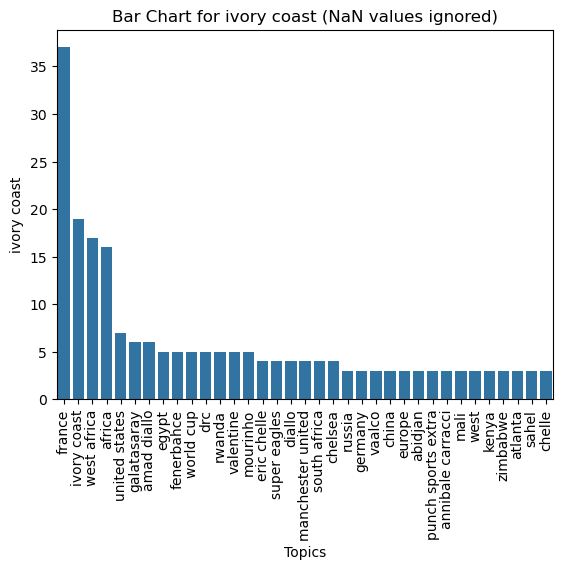

In [87]:
 # Filter out rows where 'abu dhabi' is NaN
df_clean = freq.dropna(subset=[w.value])
df_clean = freq[freq[w.value]>2]
# Sort the DataFrame by 'abu dhabi' in descending order
df_clean = df_clean.sort_values(by=w.value, ascending=False)

# Create the bar plot
sns.barplot(x=df_clean.index, y=df_clean[w.value])

plt.xlabel('Topics')
plt.ylabel(w.value)
plt.title(f'Bar Chart for {w.value} (NaN values ignored)')

plt.xticks(rotation=90)


In [71]:
index_names = freq.index.to_list()
print(index_names)

['united states', 'trump', 'russia', 'ukraine', 'china', 'israel', 'europe', 'india', 'africa', 'gaza', 'pakistan', 'france', 'palestine', 'demon slayer', 'canada', 'saudi arabia', 'united nations', 'south africa', 'egypt', 'australia', 'dubai', 'brazil', 'turkey', 'panama', 'nigeria', 'lebanon', 'mexico', 'ai', 'peru', 'hamas', 'malaysia', 'united kingdom', 'apple', 'argentina', 'indonesia', 'iran', 'ecuador', 'serbia', 'consent framework', 'britain', 'eu', 'zelensky', 'latin america', 'el salvador', 'poland', 'paddington', 'germany', 'philippines', 'sri lanka', 'england', 'getty images', 'kenya', 'london', 'bulgaria', 'world cup', 'musk', 'colombia', 'morocco', 'costa rica', 'crunchyroll', 'bahrain', 'romania', 'google', 'bolivia', 'west africa', 'iraq', 'guatemala', 'hungary', 'ghana', 'south america', 'latvia', 'japan', 'middle east', 'jordan', 'doge', 'liverpool', 'washington', 'new zealand', 'spain', 'azerbaijan', 'bbc', 'baltic', 'chile', 'congress', 'jamaica', 'putin', 'hong ko

## Build a network visual

In [93]:
freq =freq.drop(columns="the_sum", errors='ignore')
network_list=[]
for col in freq.columns:
    for index,row in freq.iterrows():
        if row[col] > 10:
            if col != index:
                network_list.append((col,index))
            
print(network_list)       

[('abu dhabi', 'uae'), ('angola', 'united states'), ('angola', 'africa'), ('angola', 'drc'), ('angola', 'rwanda'), ('angola', 'namibia'), ('angola', 'sam nujoma'), ('argentina', 'milei'), ('azerbaijan', 'turkey'), ('azerbaijan', 'iran'), ('azerbaijan', 'baku'), ('azerbaijan', 'turkmenistan'), ('bolivia', 'united states'), ('brazil', 'apple'), ('bulgaria', 'united states'), ('bulgaria', 'russia'), ('bulgaria', 'ukraine'), ('bulgaria', 'europe'), ('bulgaria', 'eu'), ('china', 'united states'), ('china', 'trump'), ('china', 'canada'), ('colombia', 'united states'), ('colombia', 'trump'), ('costa rica', 'united states'), ('costa rica', 'panama'), ('dominican republic', 'united states'), ('dominican republic', 'the dominican republic'), ('dominican republic', 'haiti'), ('dominican republic', 'dominican'), ('dubai', 'china'), ('dubai', 'india'), ('dubai', 'pakistan'), ('ecuador', 'united states'), ('ecuador', 'noboa'), ('ecuador', 'guayaquil'), ('egypt', 'united states'), ('egypt', 'trump'),

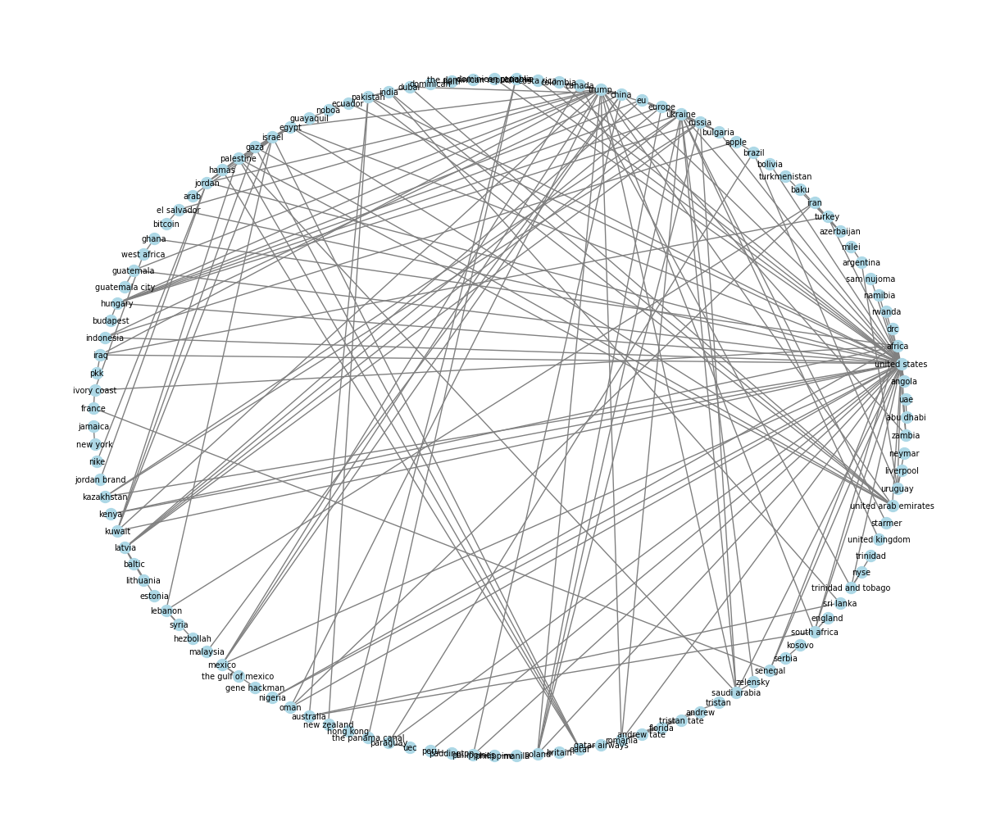

In [95]:
import networkx as nx
import matplotlib.pyplot as plt

words = [freq.columns]
connections = network_list
G = nx.Graph()
G.add_edges_from(connections)
pos = nx.circular_layout(G)



plt.figure(figsize=(12,10))
nx.draw(G,pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=100, font_size=7)
plt.show()

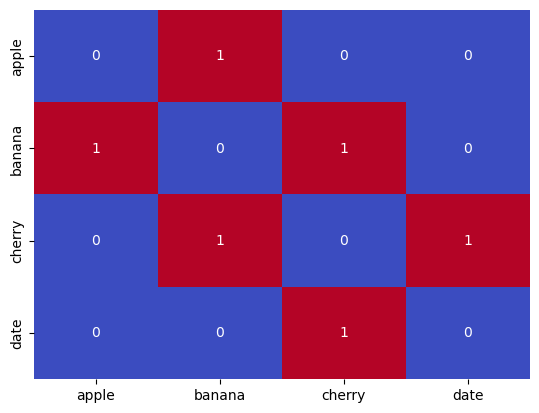

In [74]:
import numpy as np
import seaborn as sns
import pandas as pd

words = ["apple", "banana", "cherry", "date"]
matrix = np.array([[0, 1, 0, 0],
                   [1, 0, 1, 0],
                   [0, 1, 0, 1],
                   [0, 0, 1, 0]])

df = pd.DataFrame(matrix, index=words, columns=words)
sns.heatmap(df, annot=True, cmap="coolwarm", cbar=False)
plt.show()
